In [1]:
import pandas as pd 
import numpy as np 

#ML
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import accuracy_score
from scipy import stats
import matplotlib.pyplot as plt
import os
import random
from sklearn.metrics import r2_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from scipy import stats
import matplotlib.pyplot as plt
import os



In [2]:
def compute_time_discounted_spread(df, lam):
    """
    Compute time_discounted_spread for each row:
      sum_i (count of columns with value == i) * (lam ** i)
    and return median across rows.
    """
    results = []
    
    # Iterate over rows
    for _, row in df.iterrows():
        # Drop NaNs for safety
        vals = row.dropna().astype(int)
        
        # Count how many times each value i appears
        counts = vals.value_counts().to_dict()
        
        # Compute weighted sum
        tds = sum(count * (lam ** i) for i, count in counts.items())
        results.append(tds)
    
    # Return median
    median_tds = np.median(results)
    return median_tds, results


In [5]:
def row_std(df):
    """
    Compute standard deviation of each row (ignoring NaNs).
    Returns a pandas Series with same index as df.
    """
    return df.std(axis=1, skipna=True)


In [7]:
def confidence_interval(accuracy, n, confidence=0.95):
    std_error = np.sqrt(accuracy * (1 - accuracy) / n)
    z_score = stats.norm.ppf((1 + confidence) / 2)
    margin_of_error = z_score * std_error
    return (accuracy - margin_of_error, accuracy + margin_of_error)


In [9]:

all_simple = pd.DataFrame()
all_complex = pd.DataFrame()

for seed in range(0,20):
    for counter_p_small_world in range(1,6):
        #finding p
        p_small_world = counter_p_small_world*0.1
        p_small_world = np.round(p_small_world,3)
        print(p_small_world)
    
        #network name set
        network_name = f'smallworld_p0.{counter_p_small_world}_seed{seed}'
        
        #load data sets
        df1 = pd.read_csv(f"../result_small_world/unweighted/unweighted_complex_{network_name}_theta_0.1_prob_0.02_EPH-v3.csv")
        df2 = pd.read_csv(f"../result_small_world/unweighted/unweighted_complex_{network_name}_theta_0.2_prob_0.02_EPH-v3.csv")
        df3 = pd.read_csv(f"../result_small_world/unweighted/unweighted_complex_{network_name}_theta_0.3_prob_0.02_EPH-v3.csv")
        df4 = pd.read_csv(f"../result_small_world/unweighted/unweighted_complex_{network_name}_theta_0.4_prob_0.02_EPH-v3.csv")
        df5 = pd.read_csv(f"../result_small_world/unweighted/unweighted_complex_{network_name}_theta_0.5_prob_0.02_EPH-v3.csv")
    
        df8 = pd.read_csv(f"../result_small_world/unweighted/unweighted_simple_{network_name}_beta_0.02_EPH-v3.csv")
        df9 = pd.read_csv(f"../result_small_world/unweighted/unweighted_simple_{network_name}_beta_0.03_EPH-v3.csv")
        df10 = pd.read_csv(f"../result_small_world/unweighted/unweighted_simple_{network_name}_beta_0.04_EPH-v3.csv")
        df11 = pd.read_csv(f"../result_small_world/unweighted/unweighted_simple_{network_name}_beta_0.05_EPH-v3.csv")
    
    
        df1['p_small_world'] = p_small_world 
        df2['p_small_world'] = p_small_world
        df3['p_small_world'] = p_small_world
        df4['p_small_world'] = p_small_world
        df5['p_small_world'] = p_small_world
        # df6['p_small_world'] = p_small_world
        # df7['p_small_world'] = p_small_world
        
        complex_c = pd.concat([df1,df2])
        complex_c = pd.concat([complex_c,df3])
        complex_c = pd.concat([complex_c,df4])
        complex_c = pd.concat([complex_c,df5])
        # complex_c = pd.concat([complex_c,df6])
        # complex_c = pd.concat([complex_c,df7])
        complex_c = complex_c.sample(frac=1,random_state=42)
        all_complex = pd.concat([complex_c,all_complex])
    
    
        df8['p_small_world'] = p_small_world 
        df9['p_small_world'] = p_small_world
        df10['p_small_world'] = p_small_world
        df11['p_small_world'] = p_small_world
        simple_c = pd.concat([df8,df9])
        simple_c = pd.concat([simple_c,df10])
        simple_c = pd.concat([simple_c,df11])
        simple_c = simple_c.sample(frac=1,random_state=42)
        all_simple = pd.concat([simple_c,all_simple])


# Lists to store results
p_samll_world_set = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
p_samll_world_set = [0.1,0.2,0.3,0.4,0.5]
accuracies_tda = []
ci_lower_tda = []
ci_upper_tda = []
accuracies_prl = []
ci_lower_prl = []
ci_upper_prl = []

for p_small_world in p_samll_world_set:
    # Prepare data
    complex_curr = all_complex[all_complex['p_small_world'] == p_small_world]
    complex_curr = complex_curr[['EPH','corr']]
    complex_curr['complex'] = 1

    simple_curr = all_simple[all_simple['p_small_world'] == p_small_world]
    simple_curr = simple_curr[['EPH','corr']]
    simple_curr['complex'] = 0

    if len(simple_curr) > len(complex_curr):
        simple_curr = simple_curr.sample(len(complex_curr),random_state=1242)
    else:
        complex_curr = complex_curr.sample(len(simple_curr),random_state=1242)

    merged = pd.concat([simple_curr,complex_curr])
    merged = merged.sample(len(merged),random_state=1)

    X_tda = merged['EPH']
    X_prl = merged['corr']
    y = merged['complex']

    print(X_tda)
    # Split data
    X_tda_train, X_tda_test, y_tda_train, y_tda_test = train_test_split(X_tda, y, test_size=0.2, random_state=42)
    X_prl_train, X_prl_test, y_prl_train, y_prl_test = train_test_split(X_prl, y, test_size=0.2, random_state=42)

    # Train and evaluate models
    dt_tda = DecisionTreeClassifier(random_state=42)
    dt_prl = DecisionTreeClassifier(random_state=42)

    dt_tda.fit(X_tda_train.values.reshape(-1, 1), y_tda_train)
    dt_prl.fit(X_prl_train.values.reshape(-1, 1), y_prl_train)

    y_tda_pred = dt_tda.predict(X_tda_test.values.reshape(-1, 1))
    y_prl_pred = dt_prl.predict(X_prl_test.values.reshape(-1, 1))

    accuracy_tda = accuracy_score(y_tda_test, y_tda_pred)
    accuracy_prl = accuracy_score(y_prl_test, y_prl_pred)

    # Calculate confidence intervals
    ci_tda = confidence_interval(accuracy_tda, len(y_tda_test))
    ci_prl = confidence_interval(accuracy_prl, len(y_prl_test))

    # Store results
    accuracies_tda.append(accuracy_tda)
    ci_lower_tda.append(ci_tda[0])
    ci_upper_tda.append(min(1,ci_tda[1]))
    accuracies_prl.append(accuracy_prl)
    ci_lower_prl.append(ci_prl[0])
    ci_upper_prl.append(min(1,ci_prl[1]))



0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
0.1
0.2
0.3
0.4
0.5
187    3.622600
65     4.206047
58     5.264171
120    2.372161
133    4.413830
         ...   
190    1.700183
126    3.313574
133    8.251197
20     5.649738
125    1.248968
Name: EPH, Length: 32000, dtype: float64
187    3.625267
65     4.243941
58     5.360503
120    2.998224
133    4.074233
         ...   
190    1.834734
126    3.901202
133    7.513128
20     5.066027
125    1.214286
Name: EPH, Length: 32000, dtype: float64
187    3.544977
65     4.553562
58     5.270069
120    2.850781
133    3.959064
         ...   
190    1.710483
126    3.220022
133    8.065546
20     5.294313
125   

In [11]:
# Create the plot
plt.figure(figsize=(10, 7), dpi=1200)

plt.plot(p_samll_world_set, accuracies_tda, marker='o', label='EPH')
plt.fill_between(p_samll_world_set, ci_lower_tda, ci_upper_tda, alpha=0.2)

plt.plot(p_samll_world_set, accuracies_prl, marker='s', label='corr(order,deg)')
plt.fill_between(p_samll_world_set, ci_lower_prl, ci_upper_prl, alpha=0.2)

# Set x-axis to show only integer values
plt.xticks(p_samll_world_set)


plt.xlabel('Rewiring Probability',fontsize=15)
plt.ylabel('Accuracy',fontsize=15)
plt.legend(loc='lower right',fontsize=15)

# plt.ylim(0.90,1.01)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# plt.grid(True)

plt.tight_layout()

# Save the plot
# plt.show()
# plt.savefig(f'../plot-april-final-version/small_world_result.pdf', format='pdf', dpi=1200, bbox_inches='tight')
# plt.close()  # Close the plot to free up memory


In [13]:
import numpy as np

def percentile_threshold(arr, percent):
    """
    Returns integer K such that at most `percent`% of non-NaN values 
    in arr are less than or equal to K.

    Parameters
    ----------
    arr : np.ndarray
        Input array of integers or NaN.
    percent : float
        Desired percentile (0–100).

    Returns
    -------
    int
        The integer K corresponding to that percentile.
    """
    # Filter out NaN values
    valid = arr[~np.isnan(arr)]
    
    if len(valid) == 0:
        return np.nan
    
    # Compute percentile
    K = np.percentile(valid, percent, interpolation='linear')
    
    # Ensure integer output (since input elements are integers)
    return int(np.floor(K))


In [24]:
from tqdm import tqdm 
all_simple = pd.DataFrame()
all_complex = pd.DataFrame()
complex_thetas = [0.1,0.2,0.3,0.4,0.5] 
nodes_list = [str(i) for i in range(400)]

for seed in tqdm(range(0,20)):
    for counter_p_small_world in range(1,6):
        p_small_world = counter_p_small_world*0.1
        p_small_world = np.round(p_small_world,3)
    
        #network name set
        network_name = f'smallworld_p0.{counter_p_small_world}_seed{seed}'

        complex_c = pd.DataFrame()
        complex_adoption_type_c = pd.DataFrame()
        #load data sets
        for theta in complex_thetas:
            df_curr_theta = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_complex_{network_name}_theta_{theta}_prob_0.02_EPH-v3.csv")
            df_curr_theta_adoption_type = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_complex_{network_name}_theta_{theta}_prob_0.02_adoption_type.csv")
            df_curr_theta['theta'] = theta
            df_curr_theta_adoption_type['theta'] = theta
            complex_c = pd.concat([complex_c,df_curr_theta])
            complex_adoption_type_c = pd.concat([complex_adoption_type_c,df_curr_theta_adoption_type])

        _,tds = compute_time_discounted_spread(complex_c[nodes_list],lam=0.1)
        complex_c["tds"] = tds
        complex_c = complex_c.sample(frac=1,random_state=42)
        all_complex = pd.concat([complex_c,all_complex])
    

        df8 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.02_EPH-v3.csv")
        df9 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.03_EPH-v3.csv")
        df10 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.04_EPH-v3.csv")
        df11 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.05_EPH-v3.csv")
        df8['beta'] = 0.02
        df9['beta'] = 0.03
        df10['beta'] = 0.04
        df11['beta'] = 0.05
        simple_c = pd.concat([df8,df9])
        simple_c = pd.concat([simple_c,df10])
        simple_c = pd.concat([simple_c,df11])
        _,tds = compute_time_discounted_spread(simple_c[nodes_list],lam=0.1)
        simple_c["tds"] = tds
        simple_c = simple_c.sample(frac=1,random_state=42)
        all_simple = pd.concat([simple_c,all_simple])


  0%|                                                    | 0/20 [00:00<?, ?it/s]/var/folders/r3/27v441rd1vb2qdthw2f3whr00000gn/T/ipykernel_79885/3387022253.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  complex_c["tds"] = tds
 15%|██████▌                                     | 3/20 [00:03<00:22,  1.31s/it]/var/folders/r3/27v441rd1vb2qdthw2f3whr00000gn/T/ipykernel_79885/3387022253.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  complex_c["tds"] = tds
 45%|███████████████████▊                        | 9/20 [00:11<00:14, 

In [57]:
all_simple["x_column"] = all_simple["tds"]
all_complex["x_column"] = all_complex["tds"]

all_simple['network_type'] = 'Simple'
all_complex['network_type'] = 'Complex'

In [59]:
# complex_data = all_complex.copy()
# simple_data = all_simple.copy()


# # Combine both
# combined_data = pd.concat([complex_data, simple_data], axis=0)
# combined_data.index = [i for i in range(len(combined_data))]

# # Set up the figure
# fig, ax = plt.subplots(figsize=(10, 7), dpi=1200)

# # Plot the main violin plot with specified colors for simple and complex contagion
# sns.violinplot(
#     x='x_column', y='EPH', hue='network_type', data=combined_data, ax=ax, width=1,
    
#     palette={'Complex': '#377eb8', 'Simple': '#e41a1c'}
# )
# ax.set_ylabel('EPH',fontsize=18)
# ax.set_title(f'Violin Plot of EPH for Different θ/β Values ({network_name} Network)')
# ax.set_title('')

# ax.tick_params(axis='x', rotation=45)
# ax.legend_.remove()  # Remove legend

# # Customize x-axis label to show "β" in red and "θ" in black
# ax.set_xlabel('')
# ax.text(
#     0.7, -0.1, r'$\theta, q = 0.02$', ha='center', va='top', transform=ax.transAxes,
#     fontsize=18, color='black'
# )
# ax.text(
#     0.2, -0.1, r'$q, \theta = ∞$', ha='center', va='top', transform=ax.transAxes,
#     fontsize=18, color='red'
# )

# # Customize the x-axis labels with colors for the main violin plot
# for label in ax.get_xticklabels():
#     if label.get_text() in complex_data['x_column'].astype(str).unique():
#         label.set_color('#377eb8')
#     elif label.get_text() in simple_data['x_column'].astype(str).unique():
#         label.set_color('#e41a1c')

# plt.xticks(fontsize=12)
# # plt.ylim(0.9,1.8)
# # plt.ylim(0.9,1.8)

# # Adjust layout and save the plot
# # plt.tight_layout()
# # # base_path = "./res/"
# # # ensure_dir(f"{base_path}/temp.txt")
# # plot_filename = f"./fig_dist_EPH_relative_threshold_tds.pdf"
# # plt.savefig(plot_filename, format='pdf', dpi=1200, bbox_inches='tight')

# plt.show()

In [61]:
from tqdm import tqdm
# Lists to store results
theta_lists_world_set = [0.1,0.2,0.22,0.24,0.26,0.28,0.3,0.4,0.5] 
theta_lists_world_set = [0.1,0.2,0.3,0.4,0.5] 
accuracies_tda = []
ci_lower_tda = []
ci_upper_tda = []
accuracies_prl = []
ci_lower_prl = []
ci_upper_prl = []

simple_infection_ratio = [] 
tds_simple = [] 
tds_complex = [] 
tds_complex_v2 = [] 
tds_complex_v3 = [] 
tds_complex_v4 = [] 
for theta in tqdm(theta_lists_world_set):
    # Prepare data
    
    complex_curr = all_complex[all_complex['theta'] == theta]
    complex_curr = complex_curr[['EPH','corr',"tds"]]
    complex_curr['complex'] = 1

    simple_curr = all_simple.copy()
    simple_curr = simple_curr[['EPH','corr',"tds"]]
    simple_curr['complex'] = 0
    
    if len(simple_curr) > len(complex_curr):
        simple_curr = simple_curr.sample(len(complex_curr),random_state=1242)
    else:
        complex_curr = complex_curr.sample(len(simple_curr),random_state=1242)

    merged = pd.concat([simple_curr,complex_curr])
    merged = merged.sample(len(merged),random_state=1)

    X_tda = merged['EPH']
    X_prl = merged['tds']
    y = merged['complex']

    # Split data
    X_tda_train, X_tda_test, y_tda_train, y_tda_test = train_test_split(X_tda, y, test_size=0.2, random_state=42)
    X_prl_train, X_prl_test, y_prl_train, y_prl_test = train_test_split(X_prl, y, test_size=0.2, random_state=42)

    # Train and evaluate models
    dt_tda = DecisionTreeClassifier(random_state=42)
    dt_prl = DecisionTreeClassifier(random_state=42)

    dt_tda.fit(X_tda_train.values.reshape(-1, 1), y_tda_train)
    dt_prl.fit(X_prl_train.values.reshape(-1, 1), y_prl_train)

    y_tda_pred = dt_tda.predict(X_tda_test.values.reshape(-1, 1))
    y_prl_pred = dt_prl.predict(X_prl_test.values.reshape(-1, 1))

    accuracy_tda = accuracy_score(y_tda_test, y_tda_pred)
    accuracy_prl = accuracy_score(y_prl_test, y_prl_pred)

    # Calculate confidence intervals
    ci_tda = confidence_interval(accuracy_tda, len(y_tda_test))
    ci_prl = confidence_interval(accuracy_prl, len(y_prl_test))

    # Store results
    accuracies_tda.append(accuracy_tda)
    ci_lower_tda.append(ci_tda[0])
    ci_upper_tda.append(min(1,ci_tda[1]))
    accuracies_prl.append(accuracy_prl)
    ci_lower_prl.append(ci_prl[0])
    ci_upper_prl.append(min(1,ci_prl[1]))

100%|█████████████████████████████████████████████| 5/5 [00:00<00:00,  6.18it/s]


In [69]:
# Create the plot
fig, ax = plt.subplots(figsize=(10, 7), dpi=1200)

# Main lines + CIs
ax.plot(theta_lists_world_set, accuracies_tda, marker='o', label='EPH')
ax.fill_between(theta_lists_world_set, ci_lower_tda, ci_upper_tda, alpha=0.2)

ax.plot(theta_lists_world_set, accuracies_prl, marker='s', label='TDS')
ax.fill_between(theta_lists_world_set, ci_lower_prl, ci_upper_prl, alpha=0.2)

# Axes styling
ax.set_xlabel('theta', fontsize=15)
ax.set_ylabel('Accuracy', fontsize=15)
ax.tick_params(axis='both', labelsize=12)
plt.xticks(theta_lists_world_set, rotation=90)

# Legend INSIDE the plot
ax.legend(
    loc='best',         # change to 'upper right' / etc. if you prefer
    fontsize=15,
)

plt.tight_layout()
fig.savefig('./small_world_result_TDS_EPH.pdf', format='pdf', dpi=1200, bbox_inches='tight')
# plt.show()


In [71]:

all_simple = pd.DataFrame()
all_complex = pd.DataFrame()
complex_thetas = [0.1,0.2,0.3,0.4,0.5,0.22,0.24,0.26,0.28] 
nodes_list = [str(i) for i in range(400)]

for seed in range(0,20):
    for counter_p_small_world in range(1,6):
        p_small_world = counter_p_small_world*0.1
        p_small_world = np.round(p_small_world,3)
    
        #network name set
        network_name = f'smallworld_p0.{counter_p_small_world}_seed{seed}'

        complex_c = pd.DataFrame()
        complex_adoption_type_c = pd.DataFrame()
        #load data sets
        for theta in complex_thetas:
            df_curr_theta = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_complex_{network_name}_theta_{theta}_prob_0.02_EPH-v3.csv")
            df_curr_theta_adoption_type = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_complex_{network_name}_theta_{theta}_prob_0.02_adoption_type.csv")
            df_curr_theta['theta'] = theta
            df_curr_theta_adoption_type['theta'] = theta
            complex_c = pd.concat([complex_c,df_curr_theta])
            complex_adoption_type_c = pd.concat([complex_adoption_type_c,df_curr_theta_adoption_type])
            


        step_complex_only = complex_c[nodes_list].to_numpy() * (complex_adoption_type_c[nodes_list].to_numpy())
        # step_complex_only = np.where(step_complex_only == 0, np.nan, step_complex_only)
        step_simple_only = complex_c[nodes_list].to_numpy() * (1-complex_adoption_type_c[nodes_list].to_numpy())
        # step_simple_only = np.where(step_simple_only == 0, np.nan, step_simple_only)


        tmp_complex = [] 
        for list_ in step_complex_only:
            tmp_complex.append(percentile_threshold(list_,28))

        tmp_simple = [] 
        for list_ in step_simple_only:
            tmp_simple.append(percentile_threshold(list_,28))

        complex_c["tds"] = np.array(tmp_complex) - np.array(tmp_simple)
        complex_c["tds_simple"] = tmp_simple
        complex_c["tds_complex"] = tmp_complex
        complex_c["tds_v3"] = np.nanstd(complex_adoption_type_c[nodes_list].to_numpy(),axis=1)
        # complex_c["tds"] = np.abs(complex_c["tds_v1"] - complex_c["tds_v2"])
        # complex_c["tds"] = np.nanmean(step_simple_only,axis=1)
        complex_c = complex_c.sample(frac=1,random_state=42)
        all_complex = pd.concat([complex_c,all_complex])
    

        df8 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.02_EPH-v3.csv")
        df9 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.03_EPH-v3.csv")
        df10 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.04_EPH-v3.csv")
        df11 = pd.read_csv(f"../result_small_world_rlative_with_adoption_type/unweighted/unweighted_simple_{network_name}_beta_0.05_EPH-v3.csv")
        df8['theta'] = 1e19
        df9['theta'] = 1e19
        df10['theta'] = 1e19
        df11['theta'] = 1e19
        simple_c = pd.concat([df8,df9])
        simple_c = pd.concat([simple_c,df10])
        simple_c = pd.concat([simple_c,df11])
        _,tds = compute_time_discounted_spread(simple_c[nodes_list],lam=0.01)
        std = row_std(simple_c)
        simple_c["tds"] = tds
        simple_c = simple_c.sample(frac=1,random_state=42)
        all_simple = pd.concat([simple_c,all_simple])


/var/folders/r3/27v441rd1vb2qdthw2f3whr00000gn/T/ipykernel_79885/3966657074.py:35: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  tmp_complex.append(percentile_threshold(list_,28))
/var/folders/r3/27v441rd1vb2qdthw2f3whr00000gn/T/ipykernel_79885/3966657074.py:39: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  tmp_simple.append(percentile_threshold(list_,28))
/var/folders/r3/27v441rd1vb2qdthw2f3whr00000gn/T/ipykernel_79885/3966657074.py:35: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes

In [72]:
from tqdm import tqdm
# Lists to store results
theta_lists_world_set = [0.1,0.2,0.22,0.24,0.26,0.28,0.3,0.4,0.5] 
theta_lists_world_set = [0.1,0.2,0.3,0.4,0.5] 
accuracies_tda = []
ci_lower_tda = []
ci_upper_tda = []
accuracies_prl = []
ci_lower_prl = []
ci_upper_prl = []

simple_infection_ratio = [] 
tds_simple = [] 
tds_complex = [] 
tds_complex_v2 = [] 
tds_complex_v3 = [] 
tds_complex_v4 = [] 
for theta in tqdm(theta_lists_world_set):
    # Prepare data
    
    complex_curr = all_complex[all_complex['theta'] == theta]
    complex_curr = complex_curr[['EPH','corr',"simple_infection_ratio","tds","tds_simple","tds_complex"]]
    complex_curr['complex'] = 1

    simple_infection_ratio.append(complex_curr["simple_infection_ratio"].mean())
    tds_complex.append(complex_curr["tds"].mean())
    tds_complex_v2.append(complex_curr["tds_simple"].mean())
    tds_complex_v3.append(complex_curr["tds_complex"].mean())
    
    simple_curr = all_simple[all_simple['theta'] == 1e19]
    simple_curr = simple_curr[['EPH','corr',"tds"]]
    simple_curr['complex'] = 0
    tds_simple.append(simple_curr["tds"].mean())
    if len(simple_curr) > len(complex_curr):
        simple_curr = simple_curr.sample(len(complex_curr),random_state=1242)
    else:
        complex_curr = complex_curr.sample(len(simple_curr),random_state=1242)

    merged = pd.concat([simple_curr,complex_curr])
    merged = merged.sample(len(merged),random_state=1)

    X_tda = merged['EPH']
    X_prl = merged['corr']
    y = merged['complex']

    # Split data
    X_tda_train, X_tda_test, y_tda_train, y_tda_test = train_test_split(X_tda, y, test_size=0.2, random_state=42)
    X_prl_train, X_prl_test, y_prl_train, y_prl_test = train_test_split(X_prl, y, test_size=0.2, random_state=42)

    # Train and evaluate models
    dt_tda = DecisionTreeClassifier(random_state=42)
    dt_prl = DecisionTreeClassifier(random_state=42)

    dt_tda.fit(X_tda_train.values.reshape(-1, 1), y_tda_train)
    dt_prl.fit(X_prl_train.values.reshape(-1, 1), y_prl_train)

    y_tda_pred = dt_tda.predict(X_tda_test.values.reshape(-1, 1))
    y_prl_pred = dt_prl.predict(X_prl_test.values.reshape(-1, 1))

    accuracy_tda = accuracy_score(y_tda_test, y_tda_pred)
    accuracy_prl = accuracy_score(y_prl_test, y_prl_pred)

    # Calculate confidence intervals
    ci_tda = confidence_interval(accuracy_tda, len(y_tda_test))
    ci_prl = confidence_interval(accuracy_prl, len(y_prl_test))

    # Store results
    accuracies_tda.append(accuracy_tda)
    ci_lower_tda.append(ci_tda[0])
    ci_upper_tda.append(min(1,ci_tda[1]))
    accuracies_prl.append(accuracy_prl)
    ci_lower_prl.append(ci_prl[0])
    ci_upper_prl.append(min(1,ci_prl[1]))



100%|█████████████████████████████████████████████| 5/5 [00:00<00:00,  5.81it/s]


In [73]:
# Create the plot
fig, ax1 = plt.subplots(figsize=(10, 7), dpi=1200)

# Left axis (EPH and corr(order,deg))
ax1.plot(theta_lists_world_set, accuracies_tda, marker='o', label='EPH')
ax1.fill_between(theta_lists_world_set, ci_lower_tda, ci_upper_tda, alpha=0.2)

ax1.plot(theta_lists_world_set, accuracies_prl, marker='s', label='corr(order,deg)')
ax1.fill_between(theta_lists_world_set, ci_lower_prl, ci_upper_prl, alpha=0.2)

ax1.set_xlabel('theta', fontsize=15)
ax1.set_ylabel('Accuracy', fontsize=15)
plt.xticks(theta_lists_world_set,rotation=90)

ax1.tick_params(axis='both', labelsize=12)

# Right axis (log(diameter))
ax2 = ax1.twinx()
# ax2.plot(theta_lists_world_set, simple_infection_ratio, marker='s', color='tab:red', label='simple ratio')
# ax2.plot(theta_lists_world_set, tds_simple, marker='s', color='tab:orange', label='tds_simple')
ax2.plot(theta_lists_world_set, tds_complex, marker='s', color='tab:green', label='difference')
# ax2.plot(theta_lists_world_set, tds_complex_v2, marker='s', color='tab:red', label='simple')
# ax2.plot(theta_lists_world_set, tds_complex_v3, marker='s', color='tab:blue', label='complex')

ax2.set_ylabel('P30(complex) - P30(simple)', fontsize=15, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red', labelsize=12)

# Legends: combine both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
# ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='lower right', fontsize=15)

ax1.legend(
    lines_1 + lines_2,
    labels_1 + labels_2,
    loc='lower right',
    bbox_to_anchor=(1, 1),  # (x, y) → lower right corner + shifted up
    fontsize=15
)

plt.tight_layout()
# plt.show()
fig.savefig(f'./small_world_result.pdf', format='pdf', dpi=1200, bbox_inches='tight')


In [74]:
# Create the plot
fig, ax = plt.subplots(figsize=(10, 7), dpi=1200)

# Main lines + CIs
ax.plot(theta_lists_world_set, accuracies_tda, marker='o', label='EPH')
ax.fill_between(theta_lists_world_set, ci_lower_tda, ci_upper_tda, alpha=0.2)

ax.plot(theta_lists_world_set, accuracies_prl, marker='s', label='corr(order,deg)')
ax.fill_between(theta_lists_world_set, ci_lower_prl, ci_upper_prl, alpha=0.2)

# Axes styling
ax.set_xlabel('theta', fontsize=15)
ax.set_ylabel('Accuracy', fontsize=15)
ax.tick_params(axis='both', labelsize=12)
plt.xticks(theta_lists_world_set, rotation=90)

# Legend INSIDE the plot
ax.legend(
    loc='best',         # change to 'upper right' / etc. if you prefer
    fontsize=15,
)

plt.tight_layout()
fig.savefig('./small_world_result.pdf', format='pdf', dpi=1200, bbox_inches='tight')
# plt.show()


<Axes: >

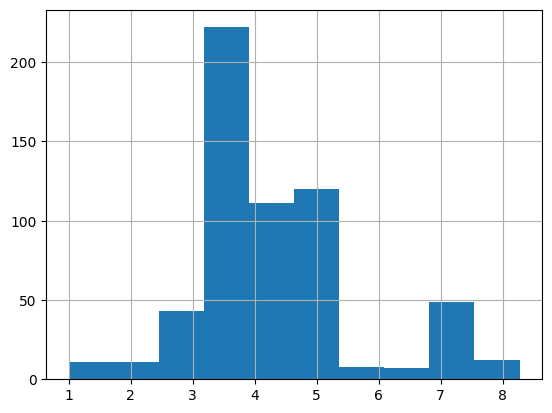

In [36]:
simple_c["EPH"].hist()

## Add plots for other percentiles as well 
## if complex and simple contagions are seprated   ---> we can call them phases 
## add it in result section. 

In [30]:
# Create the plot
plt.figure(figsize=(10, 7), dpi=1200)

plt.plot(theta_lists_world_set, accuracies_tda, marker='o', label='EPH')
plt.fill_between(theta_lists_world_set, ci_lower_tda, ci_upper_tda, alpha=0.2)

plt.plot(theta_lists_world_set, accuracies_prl, marker='s', label='corr(order,deg)')
plt.fill_between(theta_lists_world_set, ci_lower_prl, ci_upper_prl, alpha=0.2)

# Set x-axis to show only integer values
plt.xticks(theta_lists_world_set,rotation=90)


plt.xlabel('theta',fontsize=15)
plt.ylabel('Accuracy',fontsize=15)
plt.legend(loc='lower right',fontsize=15)

# plt.ylim(0.90,1.01)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# plt.grid(True)

plt.tight_layout()

# Save the plot
plt.show()
# plt.savefig(f'../plot-april-final-version/small_world_result.pdf', format='pdf', dpi=1200, bbox_inches='tight')
# plt.close()  # Close the plot to free up memory


In [19]:
# Create the plot
fig, ax1 = plt.subplots(figsize=(10, 7), dpi=1200)

# Left axis (EPH and corr(order,deg))
ax1.plot(theta_lists_world_set, accuracies_tda, marker='o', label='EPH')
ax1.fill_between(theta_lists_world_set, ci_lower_tda, ci_upper_tda, alpha=0.2)

ax1.plot(theta_lists_world_set, accuracies_prl, marker='s', label='corr(order,deg)')
ax1.fill_between(theta_lists_world_set, ci_lower_prl, ci_upper_prl, alpha=0.2)

ax1.set_xlabel('theta', fontsize=15)
ax1.set_ylabel('Accuracy', fontsize=15)
plt.xticks(theta_lists_world_set,rotation=90)

ax1.tick_params(axis='both', labelsize=12)

# Right axis (log(diameter))
ax2 = ax1.twinx()
# ax2.plot(theta_lists_world_set, simple_infection_ratio, marker='s', color='tab:red', label='simple ratio')
# ax2.plot(theta_lists_world_set, tds_simple, marker='s', color='tab:orange', label='tds_simple')
ax2.plot(theta_lists_world_set, tds_complex, marker='s', color='tab:green', label='difference')
# ax2.plot(theta_lists_world_set, tds_complex_v2, marker='s', color='tab:red', label='complex')
# ax2.plot(theta_lists_world_set, tds_complex_v3, marker='s', color='tab:blue', label='simple')

ax2.set_ylabel('Ave(complex) - Ave(simple)', fontsize=15, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red', labelsize=12)

# Legends: combine both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
# ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='lower right', fontsize=15)

ax1.legend(
    lines_1 + lines_2,
    labels_1 + labels_2,
    loc='lower right',
    bbox_to_anchor=(1, 1),  # (x, y) → lower right corner + shifted up
    fontsize=15
)

plt.tight_layout()
# plt.show()
fig.savefig(f'./small_world_result.pdf', format='pdf', dpi=1200, bbox_inches='tight')


In [20]:
# Create the plot
fig, ax1 = plt.subplots(figsize=(10, 7), dpi=1200)

# Left axis (EPH and corr(order,deg))
ax1.plot(theta_lists_world_set, accuracies_tda, marker='o', label='EPH')
ax1.fill_between(theta_lists_world_set, ci_lower_tda, ci_upper_tda, alpha=0.2)

ax1.plot(theta_lists_world_set, accuracies_prl, marker='s', label='corr(order,deg)')
ax1.fill_between(theta_lists_world_set, ci_lower_prl, ci_upper_prl, alpha=0.2)

ax1.set_xlabel('theta', fontsize=15)
ax1.set_ylabel('Accuracy', fontsize=15)
plt.xticks(theta_lists_world_set,rotation=90)

ax1.tick_params(axis='both', labelsize=12)

# Right axis (log(diameter))
ax2 = ax1.twinx()
# ax2.plot(theta_lists_world_set, simple_infection_ratio, marker='s', color='tab:red', label='simple ratio')
# ax2.plot(theta_lists_world_set, tds_simple, marker='s', color='tab:orange', label='tds_simple')
# ax2.plot(theta_lists_world_set, tds_complex, marker='s', color='tab:green', label='difference')
# ax2.plot(theta_lists_world_set, tds_complex_v2, marker='s', color='tab:red', label='complex')
# ax2.plot(theta_lists_world_set, tds_complex_v3, marker='s', color='tab:blue', label='simple')
ax2.plot(theta_lists_world_set, tds_complex_v4, marker='s', color='tab:purple', label='n_complex')

ax2.set_ylabel('Simple Infection', fontsize=15, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red', labelsize=12)

# Legends: combine both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
# ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='lower right', fontsize=15)

ax1.legend(
    lines_1 + lines_2,
    labels_1 + labels_2,
    loc='lower right',
    bbox_to_anchor=(1, 1),  # (x, y) → lower right corner + shifted up
    fontsize=15
)

plt.tight_layout()
# plt.show()
fig.savefig(f'./small_world_result.pdf', format='pdf', dpi=1200, bbox_inches='tight')


In [54]:
np.corrcoef(tds_complex_v2,accuracies_tda)

array([[ 1.        , -0.68621434],
       [-0.68621434,  1.        ]])

In [162]:
complex_curr

,EPH,corr,simple_infection_ratio,tds,complex
143,8.199007,-0.003138,0.484733,12.704835,1
69,8.934536,-0.016490,0.584071,11.792818,1
109,8.510497,0.070581,0.621622,10.791209,1
101,8.564351,-0.015501,0.590308,12.254795,1
64,8.834810,-0.036330,0.557522,12.705056,1
...,...,...,...,...,...
56,6.601803,-0.011048,0.474138,13.260116,1
155,7.263495,-0.075395,0.502183,12.718391,1
5,8.038734,-0.005731,0.569444,13.300292,1
71,7.227594,-0.013345,0.571429,11.463768,1


In [149]:
# --- Configuration: Define base directories ---
NETWORK_DIR = '../networks/unweighted'
RESULT_DIR = '../result_small_world/unweighted'


In [151]:
def load_graph(file_path):
    """
    Load a graph from a GraphML file and preprocess node labels.
    """
    G = nx.read_graphml(file_path)
    mapping = {node: int(float(node)) for node in G.nodes()}
    G = nx.relabel_nodes(G, mapping)
    return G

In [153]:
network_name

'smallworld_p0.5_seed19'

In [157]:
# network_name = "email_eu_modified"
# network_name = "conf"
# network_name = "school"
import networkx as nx
graph_path = os.path.join(NETWORK_DIR, f'G_unweighted_{network_name}.graphml')
G = load_graph(graph_path)

Number of nodes: 400
Number of edges: 2800
Mean degree: 14.0
Median degree: 14.0

Degree percentiles:
  0th percentile: 8.0
 10th percentile: 11.0
 25th percentile: 12.0
 50th percentile: 14.0
 75th percentile: 16.0
 90th percentile: 17.0
 95th percentile: 18.0
 99th percentile: 20.0
100th percentile: 20.0


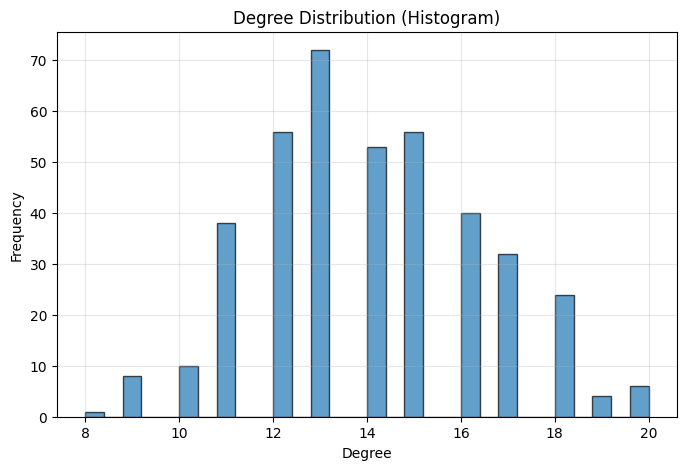

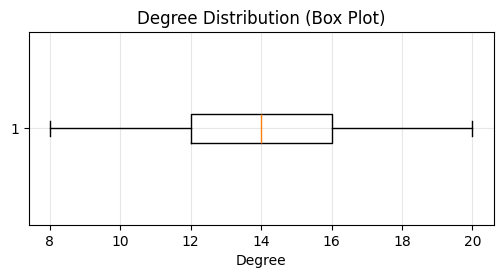

In [159]:
# Assuming your graph is named G
degrees = [d for _, d in G.degree()]

# Print basic stats and percentiles
print("Number of nodes:", len(G))
print("Number of edges:", len(G.edges()))
print("Mean degree:", np.mean(degrees))
print("Median degree:", np.median(degrees))

percentiles = np.percentile(degrees, [0, 10, 25, 50, 75, 90, 95, 99, 100])
print("\nDegree percentiles:")
for p, v in zip([0,10,25,50,75,90,95,99,100], percentiles):
    print(f"{p:>3}th percentile: {v}")

# Plot histogram
plt.figure(figsize=(8,5))
plt.hist(degrees, bins=30, edgecolor='black', alpha=0.7)
plt.title("Degree Distribution (Histogram)")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.grid(alpha=0.3)
plt.show()

# Plot boxplot
plt.figure(figsize=(6,2.5))
plt.boxplot(degrees, vert=False)
plt.title("Degree Distribution (Box Plot)")
plt.xlabel("Degree")
plt.grid(alpha=0.3)
plt.show()

In [161]:
len(G.nodes())

400

In [163]:
0.3*14

4.2

# first time that ccomplex contagion ocurrs 
# first time that 50 of complex adoptions happend. 

# Seems EPH can not distinguish simple and complex contagion when at first steps we don't have complex adoption.
## add expreiment to see an indicator which is maximize in 0.3
## var of time EPH 
## Add to discussion section : what is simple ? compare with trends of simple ratio. 